## Facebook Group Analisys
###### Objective of this notebook is to analise data from 4 public facebook groups and try to awnser questions like:
###### 1. Interatctions for each group (Likes, Shares, Comments)
###### 2. Length of posts influence the number of interactions
###### 3. Punchcard of the hours, groups and number of likes shares and comments

In [1]:
using DataFrames, Gadfly, Vega

In [2]:
comment = "../datasets/facebook/Cheltenham's Facebook Groups/comment.csv"
like = "../datasets/facebook/Cheltenham's Facebook Groups/like.csv"
post = "../datasets/facebook/Cheltenham's Facebook Groups/post.csv"

"../datasets/facebook/Cheltenham's Facebook Groups/post.csv"

In [3]:
# Read all datasets

#
# comment.csv 23.6 MB
#

@time df_comments = readtable(comment)

#
# like.csv 16.1 MB
#

@time df_likes = readtable(like)

#
# posts.csv 6.6 MB
#

@time df_posts = readtable(post)

  2.894292 seconds (6.85 M allocations: 303.170 MB, 5.88% gc time)
  0.515455 seconds (3.77 M allocations: 192.156 MB, 27.01% gc time)
  0.709234 seconds (436.44 k allocations: 33.046 MB)


,gid,pid,id,name,timeStamp,shares,url,msg,likes
1,117291968282998,117291968282998_1219433751402142,10210474998334559,Michelle Bernstein,2016-06-03 16:45:43,0,https://www.facebook.com/groups/117291968282998/permalink/1219433751402142/,AJ Preschool and Infant Center is looking for late afternoon help for the summer{COMMA} beginning June 14 - 3-6pm. Interested or know someone who might be? Please let me know!,3.0
2,117291968282998,117291968282998_1217805638231620,10100194059447241,Rob Zwerling,2016-06-01 00:57:56,1,https://www.facebook.com/groups/117291968282998/permalink/1217805638231620/,O.K whats the deal with this Poison Ivy Rash that{APOST}s been going around? I got it a few days{COMMA} a dude saw it on my arms told me it was poison Ivy that{APOST}s been going around/ alot of folks getting. This evening I walk in the Walgreen{APOST}s at Yorktown Plaza with my swollen red oozing forearms to get astringent and Poison Ivy Wash. The clerk said Oh you{APOST}re the fifth person who came in with Poison Ivy (can{APOST}t remember if she said today/week). Anyhow this makes no sense as Poison Ivy is acquired from the oil of a Plant. Once you bath{COMMA} change your clothes you can{APOST}t spread it.,NA
3,117291968282998,117291968282998_1218402164838634,10101189472454825,Sandra Mose,2016-06-01 21:59:01,1,https://www.facebook.com/groups/117291968282998/permalink/1218402164838634/,Hi Neighbors {COMMA} anybody aware of a good Real Estate agent who wouldn{APOST}t mind working with a poor social worker?{RET}Names{COMMA} phone numbers{COMMA} emails and FB pages are all welcome. {RET}{RET}Spasiba!!,1.0
4,117291968282998,117291968282998_1218917638120420,1252648581426608,Paula Sun Moon Diorio,2016-06-02 20:16:49,0,https://www.facebook.com/groups/117291968282998/permalink/1218917638120420/,A friend of mine just told me that the sewer system is being replaced in Cheltenham...does this include elkins park?,NA
5,117291968282998,117291968282998_1219380338074150,10207388892348282,Rhonda Genzink Isser,2016-06-03 14:57:15,2,https://www.facebook.com/groups/117291968282998/permalink/1219380338074150/,A group Cheltenham Lateral Solutions was created today. This is a page that was created specifically to address issues and bring awareness to the issue of lateral inspection and repairs in Cheltenham Township{COMMA} with the intent of finding monetary and positive solutions. Our hope and objective is to assist homeowners in dealing with what might be a monumental problem. Like- minded{COMMA}proactive individuals are welcome and encouraged to join.,19.0
6,117291968282998,117291968282998_1219353724743478,10154432118844644,Benjamin Lloyd,2016-06-03 14:15:20,0,https://www.facebook.com/groups/117291968282998/permalink/1219353724743478/,Sad about Arts in the Park being postponed? Here{APOST}s a fun Elkins Park community event tomorrow - rain or shine!,2.0
7,117291968282998,117291968282998_1219004564778394,10207440105144758,Judy Glass,2016-06-02 23:46:03,0,https://www.facebook.com/groups/117291968282998/permalink/1219004564778394/,Heard a rumor that Art{APOST}s In The Park is postponed due to weather forecast??,4.0
8,117291968282998,117291968282998_1219059831439534,1137790542929687,Susan Chelder Schuman,2016-06-03 02:02:35,1,https://www.facebook.com/groups/117291968282998/permalink/1219059831439534/,GIANT ELKINS PARK YARD SALE SAT & SUN 6/11 & 6/12 {RET}SO MUCH STUFF,5.0
9,117291968282998,117291968282998_1218963568115827,10154487807879363,Patricia Cartier Derr,2016-06-02 21:52:12,0,https://www.facebook.com/groups/117291968282998/permalink/1218963568115827/,We are looking forward someone to tear down and remove our side porch including the roof. Any construction or - in this case - destruction person/company anyone would recommend? TIA!,NA
10,117291968282998,117291968282998_1218942504784600,10210234991020685,Chris Mascia,2016-06-02 21:05:45,0,https://www.facebook.com/groups/117291968282998/permalink/1218942504784600/,Need a small section of stucco replaced on the sid

In [4]:
# Create a new DataFrame to store the message, # likes, # shares ,# comments, msg_length and gid

comments_count = by(df_comments, :pid, df -> size(df[:cid],1))
data = join(df_posts, comments_count, on = :pid)[[:msg, :likes, :shares,:x1,:gid]]
len = [length(c) for c in df_posts[:msg]]
#rename columns

names!(data, [:msg, :likes, :shares, :comments, :gid])

,msg,likes,shares,comments,gid
1,Hi{COMMA} we were stood up again (every day since Tuesday) by a very reputable landscaping company. The yard is a mess. Can anyone come to just mow and de-vine our front tomorrow? Pm me and I will send an address{COMMA} we are by the EP station. Ugh.,1.0,1,6,117291968282998
2,Hi friends. We hope you{APOST}ll join us for this very special free event Sunday 5/17 at 3pm at the Elkins Park Train Station.,18.0,9,1,117291968282998
3,Hi! We are hoping to move to the area this summer. Any recommendations on apartments/town homes in the area? We are looking for three bedrooms. {RET}{RET}Thanks!!!,2.0,0,8,117291968282998
4,Our Mandarin Chinese tutor is moving to England. Does anyone on here do Mandarin tutoring or know someone who does? It is for our almost 7 year old daughter once a week. Thanks!!!,2.0,1,3,117291968282998
5,Mom{APOST}s & Dad{APOST}s- Do you need activities for your kids this summer? Tennis lessons 2 or 3 times a week give them a lifetime sport and exercise. Call me 215 512 0697.,2.0,1,5,117291968282998
6,Any recommendations for a good local hairdressers? Looking for a nice blow dry for my husbands graduation. Either in Elkins park/glenside/willow grove area.,4.0,0,37,117291968282998
7,Thanks everybody for the responses regarding the house on Shoemaker and Manor. Looks like Anne Litman Rubin has it under control so I took the post down.,30.0,0,10,117291968282998
8,Can anyone recommend a reasonable surveyor? Thanks!,NA,0,5,117291968282998
9,We have an inground pool for many years and now have a group of very young raccoons without mama hanging around the edge...{RET}Any suggestions?,NA,0,6,117291968282998
10,Does anyone know of a non biased website that can give me a sample ballot for voting today? I{APOST}m new to EP and philly always had a great site for briefing of the candidates and questions.,1.0,0,6,117291968282998


<p>Need to replace group id</p>
<p>117291968282998<b>-></b>Elkins Park Happenings<b>-></b>1<br>
25160801076<b>-></b>Unofficial Cheltenham Township<b>-></b>2<br>
443890352589739<b>-></b>Free Speech Zone<b>-></b>3<br>
1239798932720607<b>-></b>Cheltenham Lateral Solutions<b>-></b>4</p>

In [5]:
data[:gid] = map(e -> replace(string(e), "117291968282998",1), data[:gid])
data[:gid] = map(e -> replace(string(e), "25160801076",2), data[:gid])
data[:gid] = map(e -> replace(string(e), "1443890352589739",3), data[:gid])
data[:gid] = map(e -> replace(string(e), "1239798932720607",4), data[:gid])

function replacena!(dframe::DataFrame, replacement::Any)
    nrows, ncols = size(dframe)
    for j = 1:ncols; for i = 1:nrows
            if isna(dframe[i,j]); dframe[i,j] = replacement; end
        end
    end
end

@time replacena!(data, 0)
unique!(data, :msg)
size(data)

  0.022273 seconds (62.49 k allocations: 1.178 MB)


(8662,5)

#### Interactions in each group (Likes, Shares, Comments)

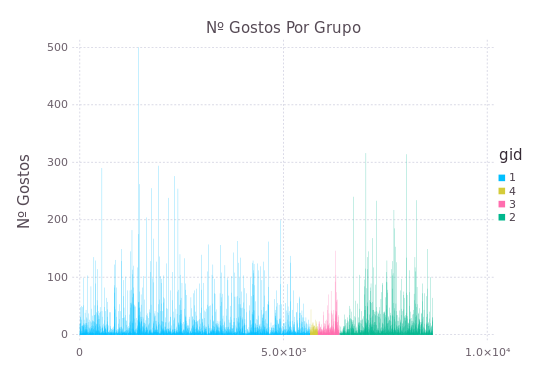

In [6]:
plot(data, color=:gid, y=:likes,Geom.bar,Theme(default_color=colorant"green"), Guide.ylabel("Nº Gostos"), Guide.title("Nº Gostos Por Grupo"))

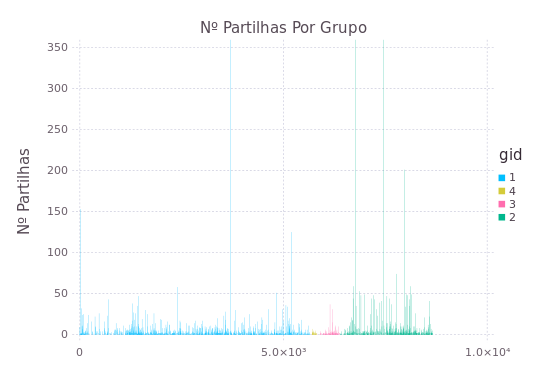

In [10]:
plot(data,color=:gid, y=:shares,Geom.bar,Coord.cartesian(ymin=0, ymax=350),Theme(default_color=colorant"green"), Guide.ylabel("Nº Partilhas"), Guide.title("Nº Partilhas Por Grupo"))

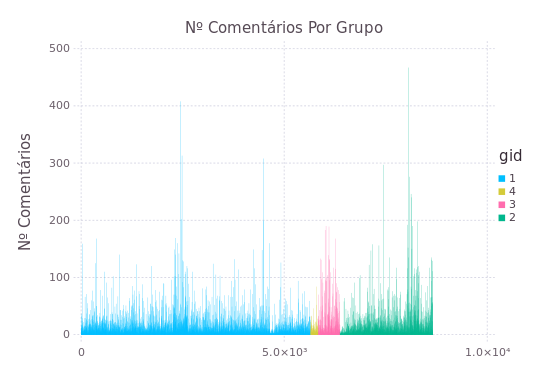

In [11]:
plot(data, color=:gid, y=:comments,Geom.bar,Theme(default_color=colorant"green"),  Guide.ylabel("Nº Comentários"), Guide.title("Nº Comentários Por Grupo"))

###### Relation between length of the posts and the number of Likes, Shares and Comments

In [12]:
len = [length(c) for c in data[:msg]]
data[:len] = len

8662-element Array{Int64,1}:
  250
  126
  163
  180
  174
  156
  153
   51
  144
  192
   65
  168
   76
    ⋮
   53
  129
  499
 1678
  131
   35
 1512
   61
 1616
 1135
  232
  109

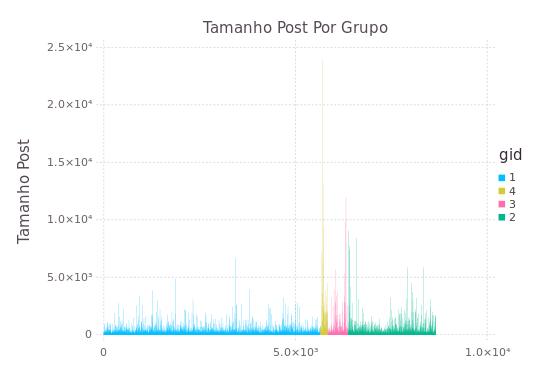

In [13]:
plot(data, color=:gid, y=:len,Geom.bar,Theme(default_color=colorant"green"),  Guide.ylabel("Tamanho Post"), Guide.title("Tamanho Post Por Grupo"))

#### In group 1 and 2 posts get more likes and shares
#### Group 2 gets more comments than the other groups
#### Message length is equals in all 4 groups

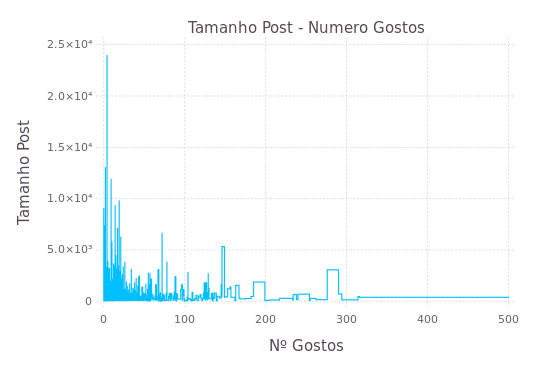

In [14]:
plot(x=data[:likes], y=len, Geom.step, Guide.xlabel("Nº Gostos"), Guide.ylabel("Tamanho Post"), Guide.title("Tamanho Post - Numero Gostos"))

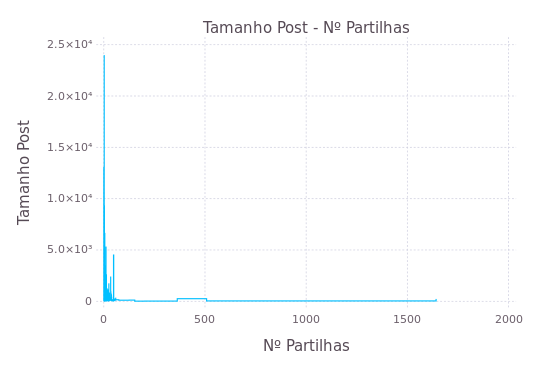

In [15]:
plot(x=data[:shares], y=len, Geom.step, Guide.xlabel("Nº Partilhas"), Guide.ylabel("Tamanho Post"), Guide.title("Tamanho Post - Nº Partilhas"))

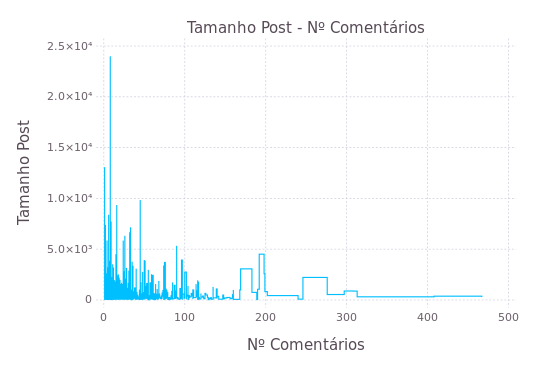

In [16]:
plot(x=data[:comments], y=len, Geom.step, Guide.xlabel("Nº Comentários"), Guide.ylabel("Tamanho Post"), Guide.title("Tamanho Post - Nº Comentários"))

##### Taking a look at the raltion between the number of likes and shares
#### High number of likes ------> Low number of shares
#### High number of shares ------> Low number of Likes

In [17]:
shares_sorted = sort(data, cols=[:shares], rev=true)
#plot(shares_sorted, x=:shares, y=:likes, Geom.point, Geom.smooth(method=:lm) ,Coord.cartesian(xmin=0, xmax=100), Guide.xlabel("Shares"), Guide.ylabel("Likes"))

,msg,likes,shares,comments,gid,len
1,Irish Setter puppy just found around Tookany Creek Parkway and Jenkintown Rds. No collar{COMMA} coat was just groomed or bathed because it still has a shampoo smell. Currently at the Garza residence. Call 215.817.4621 for Len Garza,59.0,1642,38,2,231
2,Anyone lose a great dog? 215-913-6659,10.0,508,45,2,37
3,lost dog This naughty lab got away last night in the area of Spring and Rambler. He knows the neighborhood and lives on Elkins Ave. Loves to go after a ball or investigate a squeaky thing. Pls comment or pm if spotted. Chipped but not wearing a collar,13.0,363,94,1,254
4,Who does she belong to,5.0,201,41,2,22
5,Free to do list!,19.0,153,2,1,16
6,Found dog on Asbourne Rd in Elkins Park..he was running on the Road..message me if you know his owner ...please share,4.0,125,28,1,117
7,Please repost & help find this missing 5-month old female puppy who ran away on this frigid day in Wyncote!,5.0,74,7,2,107
8,I found this dog today on Central Ave. by Burholme Park. She had no collar and kept running into the busy street{COMMA} so I brought her home with me. We{APOST}re looking for her owners. I figure she{APOST}s from the Fox Chase/Cheltenham area. She is really sweet. If you recognize her or think you know who her owners are{COMMA} please let me know!!,9.0,59,6,2,355
9,found dog. shes got a limp and shes dirty. red collar no tags. poor girl. lmk if you know anything. found by green lane and washington lane in wyncote pa,8.0,59,54,2,153
10,Lost dog - last seen near High School & Marvin Roads. Please let me know if you{APOST}ve seen him. Thank you!,5.0,58,20,1,109


In [19]:
value = quantile(data[:shares],0.98)
typeof(value)
shared = data[data[:shares] .> value,:][[:msg, :shares]]
sorted = sort!(shared, cols=[order(:shares, rev = true)])

println("Nª Partilhas: ", sorted[1,:shares],"\n", "Mensagem: "sorted[1,:msg], "\n")
println("Nª Partilhas: ", sorted[2,:shares],"\n", "Mensagem: "sorted[2,:msg], "\n")
println("Nª Partilhas: ", sorted[3,:shares],"\n", "Mensagem: "sorted[3,:msg], "\n")
println("Nª Partilhas: ", sorted[4,:shares],"\n", "Mensagem: "sorted[4,:msg], "\n")
println("Nª Partilhas: ", sorted[5,:shares],"\n", "Mensagem: "sorted[5,:msg], "\n")

Nª Partilhas: 1642
Mensagem: Irish Setter puppy just found around Tookany Creek Parkway and Jenkintown Rds. No collar{COMMA} coat was just groomed or bathed because it still has a shampoo smell. Currently at the Garza residence. Call 215.817.4621 for Len Garza

Nª Partilhas: 508
Mensagem: Anyone lose a great dog? 215-913-6659

Nª Partilhas: 363
Mensagem: lost dog  This naughty lab got away last night in the area of Spring and Rambler.  He knows the neighborhood and lives on Elkins Ave.  Loves to go after a ball or investigate a squeaky thing. Pls comment or pm if spotted. Chipped but not wearing a collar

Nª Partilhas: 201
Mensagem: Who does she belong to

Nª Partilhas: 153
Mensagem: Free to do list!



In [20]:
value = quantile(data[:likes],0.98)
typeof(value)
liked = data[data[:likes] .> value,:][[:msg, :likes]]
sorted_likes = sort!(liked, cols=[order(:likes, rev = true)])

println("Nº Gostos: ", sorted_likes[1,:likes],"\n", "Mensagem: "sorted_likes[1,:msg], "\n")
println("Nº Gostos: ", sorted_likes[2,:likes],"\n", "Mensagem: "sorted_likes[2,:msg], "\n")
println("Nº Gostos: ", sorted_likes[3,:likes],"\n", "Mensagem: "sorted_likes[3,:msg], "\n")
println("Nº Gostos: ", sorted_likes[4,:likes],"\n", "Mensagem: "sorted_likes[4,:msg], "\n")
println("Nº Gostos: ", sorted_likes[5,:likes],"\n", "Mensagem: "sorted_likes[5,:msg], "\n")

Nº Gostos: 500.0
Mensagem: Hi neighbors -- I{APOST}m the pastor at St. John{APOST}s Lutheran Church at 1224 Melrose Ave{COMMA} where we have a generator(!). If our neighborhood should lose power in the wind and snow tomorrow{COMMA} we plan to open the church so that folks within walking distance can come inside{COMMA} get warm{COMMA} and charge their devices as necessary. I{APOST}ll post an invitation here tomorrow if the power goes out. Please know that you are all welcome!

Nº Gostos: 316.0
Mensagem: Angels among us:{RET}{RET}While cashiering at the co-op today{COMMA} a woman came through my line with a 70.00 grocery. When she tried to pay with food stamps{COMMA} it turned out that she didn{APOST}t have enough in that account to pay. The woman next to her in line quietly handed me her credit card and said Please put her groceries on my account. {RET}I literally had tears in my eyes.

Nº Gostos: 314.0
Mensagem: As I rounded on my patients today at The Oaks Assisted Living{COMMA} I cam

<h4>Observation</h4>
<p>This results make sense, since the most shared messages are from people reporting that they found/lost a dog, what makes sense people sharing to spread the message. The most liked ones are from people that are new to the town, or making anouncemnts and sharing writting stories</p>

In [21]:
### Most Commented Posts
value = quantile(data[:comments],0.98)
typeof(value)
comments = data[data[:comments] .> value,:][[:msg, :comments]]
sorted_comments = sort!(comments, cols=[order(:comments, rev = true)])

println("Nº Comentários: ", sorted_comments[1,:comments],"\n", "Mensagem: "sorted_comments[1,:msg], "\n")
println("Nº Comentários: ", sorted_comments[2,:comments],"\n", "Mensagem: "sorted_comments[2,:msg], "\n")
println("Nº Comentários: ", sorted_comments[3,:comments],"\n", "Mensagem: "sorted_comments[3,:msg], "\n")
println("Nº Comentários: ", sorted_comments[4,:comments],"\n", "Mensagem: "sorted_comments[4,:msg], "\n")
println("Nº Comentários: ", sorted_comments[5,:comments],"\n", "Mensagem: "sorted_comments[5,:msg], "\n")

Nº Comentários: 467
Mensagem: I{APOST}ve been reading up the impending lateral sewer repair requirements. Can someone explain how that relates to the township{APOST}s problem of excess sewage entering Philly{APOST}s system. I figure i should understand the situation before deciding on whether to be upset or not.

Nº Comentários: 408
Mensagem: Question about Alverthrope Park. I  don{APOST}t know what rock I live under but I just discovered it yesterday and loved running there.  However{COMMA} I hear it{APOST}s only open to Abington residents.  How strict are they?     The security guard let me come in but I wasn{APOST}t sure if this was a one time thing or if they were not as strict as others told me they were.

Nº Comentários: 313
Mensagem: Silly question. I{APOST}ve read lots of positive things about Avelthorpe Park. We live in the Cheltenham Township part of EP (just moved here in April). Can we not use this park because we are not Abington Twp residents? The wading pool sounds great

In [23]:
data_filtered = data[[:gid, :likes, :comments, :shares]]
dm = aggregate(data_filtered, :gid, mean)
sort!(dm, cols=[:gid])

,gid,likes_mean,comments_mean,shares_mean
1,1,7.514856738592147,11.029182879377432,0.8625751680226389
2,2,9.156905594405595,13.290646853146853,2.2591783216783217
3,3,7.55452865064695,15.865064695009242,0.5693160813308688
4,4,5.849162011173185,7.441340782122905,0.4245810055865922


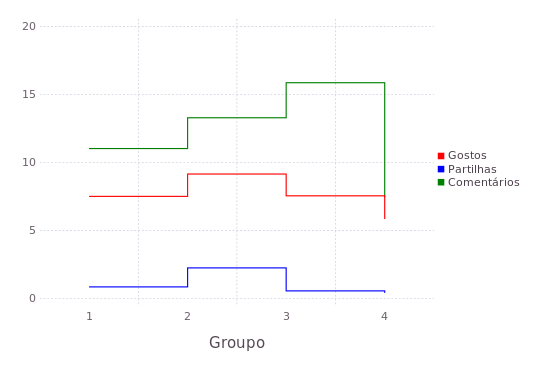

In [27]:
plot( Guide.XLabel("Groupo"), Guide.YLabel(nothing), Scale.y_distribution,
      Gadfly.layer(dm, x=:gid, y=:likes_mean, Geom.step,Theme(default_color=colorant"red")),
      Gadfly.layer(dm, x=:gid, y=:shares_mean, Geom.step,Theme(default_color=colorant"blue")),
      Gadfly.layer(dm, x=:gid, y=:comments_mean, Geom.step,Theme(default_color=colorant"green")),
      Guide.manual_color_key("", ["Gostos", "Partilhas", "Comentários"], ["red", "blue","green"]))

### Continues in Facebook_pt2.ipynb 

#### Most shared posts contain info about lost dogs or are posts asking help for something
#### Most liked posts are messages from new neighbours wanting to know something about the town
#### Post with a greater number of comments are discussions about problems in existing in the town